In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Sklearn for metrics
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow Version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")


2025-10-30 13:33:53.070223: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761831233.287324      37 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761831233.335840      37 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


TensorFlow Version: 2.18.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [2]:
# Define base directory (Kaggle input path)
base_dir = '/kaggle/input/chest-xray-pneumonia/chest_xray'

# Check directory structure
print("Dataset Structure:")
for folder in ['train', 'test', 'val']:
    folder_path = os.path.join(base_dir, folder)
    print(f"\n{folder.upper()}:")
    for category in os.listdir(folder_path):
        category_path = os.path.join(folder_path, category)
        num_images = len(os.listdir(category_path))
        print(f"  {category}: {num_images} images")

# Define directories
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')


Dataset Structure:

TRAIN:
  PNEUMONIA: 3875 images
  NORMAL: 1341 images

TEST:
  PNEUMONIA: 390 images
  NORMAL: 234 images

VAL:
  PNEUMONIA: 8 images
  NORMAL: 8 images


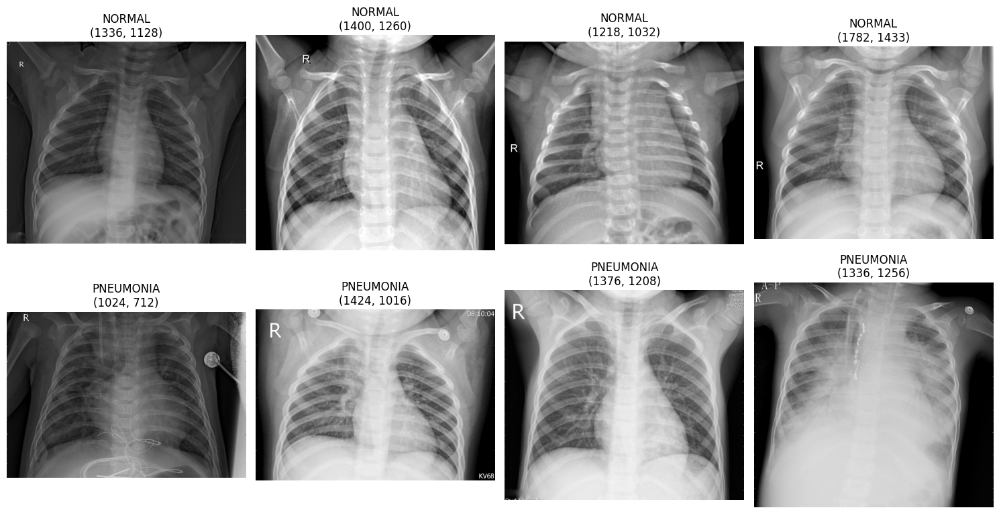

In [3]:
# Visualize sample images from training set
def plot_samples(directory, num_samples=8):
    normal_dir = os.path.join(directory, 'NORMAL')
    pneumonia_dir = os.path.join(directory, 'PNEUMONIA')
    
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    
    # Plot Normal X-rays
    normal_images = os.listdir(normal_dir)[:4]
    for i, img_name in enumerate(normal_images):
        img_path = os.path.join(normal_dir, img_name)
        img = Image.open(img_path)
        axes[0, i].imshow(img, cmap='gray')
        axes[0, i].set_title(f'NORMAL\n{img.size}')
        axes[0, i].axis('off')
    
    # Plot Pneumonia X-rays
    pneumonia_images = os.listdir(pneumonia_dir)[:4]
    for i, img_name in enumerate(pneumonia_images):
        img_path = os.path.join(pneumonia_dir, img_name)
        img = Image.open(img_path)
        axes[1, i].imshow(img, cmap='gray')
        axes[1, i].set_title(f'PNEUMONIA\n{img.size}')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_samples(train_dir)


In [4]:
# Image parameters
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

# Data augmentation for training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Only rescaling for validation and test sets
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=True
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

print(f"\nClass Indices: {train_generator.class_indices}")
print(f"Training samples: {train_generator.samples}")
print(f"Validation samples: {val_generator.samples}")
print(f"Test samples: {test_generator.samples}")


Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.

Class Indices: {'NORMAL': 0, 'PNEUMONIA': 1}
Training samples: 5216
Validation samples: 16
Test samples: 624


In [5]:
# Option 1: Simple CNN Architecture
def build_simple_cnn():
    model = Sequential([
        # First Convolutional Block
        keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        keras.layers.MaxPooling2D(2, 2),
        keras.layers.BatchNormalization(),
        
        # Second Convolutional Block
        keras.layers.Conv2D(64, (3, 3), activation='relu'),
        keras.layers.MaxPooling2D(2, 2),
        keras.layers.BatchNormalization(),
        
        # Third Convolutional Block
        keras.layers.Conv2D(128, (3, 3), activation='relu'),
        keras.layers.MaxPooling2D(2, 2),
        keras.layers.BatchNormalization(),
        
        # Fourth Convolutional Block
        keras.layers.Conv2D(256, (3, 3), activation='relu'),
        keras.layers.MaxPooling2D(2, 2),
        keras.layers.BatchNormalization(),
        
        # Dense Layers
        keras.layers.Flatten(),
        keras.layers.Dense(512, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(128, activation='relu'),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(1, activation='sigmoid')
    ])
    
    return model

# Create the model
model = build_simple_cnn()
model.summary()


I0000 00:00:1761831249.101251      37 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1761831249.101895      37 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 111, 111, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 54, 54, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 26, 26, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 12, 12, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,874,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,331,009 (73.74 MB)

 Trainable params: 19,330,049 (73.74 MB)

 Non-trainable params: 960 (3.75 KB)

In [6]:
# Option 2: Transfer Learning with VGG16 (Better Performance)
def build_vgg16_model():
    # Load pre-trained VGG16 without top layers
    base_model = VGG16(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
    )
    
    # Freeze base model layers
    for layer in base_model.layers:
        layer.trainable = False
    
    # Add custom classification head
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(1, activation='sigmoid')(x)
    
    model = Model(inputs=base_model.input, outputs=predictions)
    
    return model

# Uncomment to use VGG16 instead of simple CNN
# model = build_vgg16_model()
# model.summary()


In [7]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        keras.metrics.Precision(name='precision'),
        keras.metrics.Recall(name='recall'),
        keras.metrics.AUC(name='auc')
    ]
)


In [9]:
# Train the model
EPOCHS = 30

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    
    verbose=1
)

print("\nTraining completed!")


Epoch 1/30


I0000 00:00:1761831364.624706     122 service.cc:148] XLA service 0x792e34017d50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761831364.625455     122 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1761831364.625474     122 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1761831365.254368     122 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/163 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.6797 - auc: 0.5708 - loss: 0.8028 - precision: 0.7480 - recall: 0.8775 

I0000 00:00:1761831372.787198     122 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


163/163 ━━━━━━━━━━━━━━━━━━━━ 131s 716ms/step - accuracy: 0.8574 - auc: 0.9118 - loss: 0.4228 - precision: 0.8945 - recall: 0.9164 - val_accuracy: 0.5000 - val_auc: 0.5000 - val_loss: 8.0398 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 2/30
163/163 ━━━━━━━━━━━━━━━━━━━━ 87s 533ms/step - accuracy: 0.9071 - auc: 0.9556 - loss: 0.2708 - precision: 0.9331 - recall: 0.9422 - val_accuracy: 0.5000 - val_auc: 0.5000 - val_loss: 10.8044 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 3/30
163/163 ━━━━━━━━━━━━━━━━━━━━ 87s 534ms/step - accuracy: 0.9159 - auc: 0.9639 - loss: 0.2440 - precision: 0.9411 - recall: 0.9446 - val_accuracy: 0.5000 - val_auc: 0.5000 - val_loss: 8.8887 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 4/30
163/163 ━━━━━━━━━━━━━━━━━━━━ 88s 536ms/step - accuracy: 0.9315 - auc: 0.9716 - loss: 0.2088 - precision: 0.9505 - recall: 0.9573 - val_accuracy: 0.5000 - val_auc: 0.6250 - val_loss: 4.0051 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 5/30
163/163 ━━━━━━━━━━

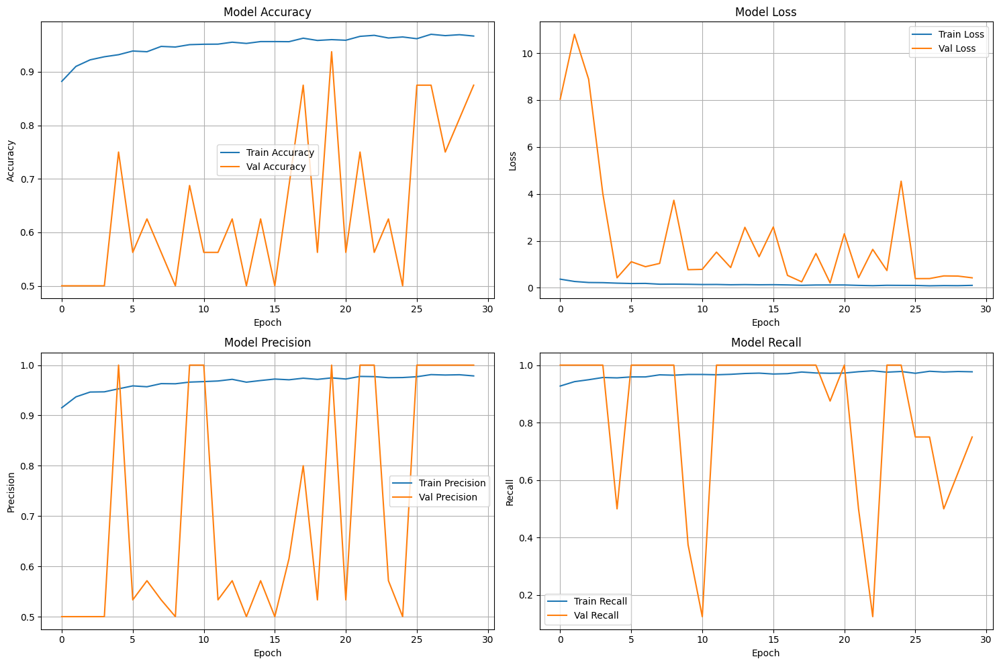

In [10]:
# Plot training history
def plot_training_history(history):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Accuracy
    axes[0, 0].plot(history.history['accuracy'], label='Train Accuracy')
    axes[0, 0].plot(history.history['val_accuracy'], label='Val Accuracy')
    axes[0, 0].set_title('Model Accuracy')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Accuracy')
    axes[0, 0].legend()
    axes[0, 0].grid(True)
    
    # Loss
    axes[0, 1].plot(history.history['loss'], label='Train Loss')
    axes[0, 1].plot(history.history['val_loss'], label='Val Loss')
    axes[0, 1].set_title('Model Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True)
    
    # Precision
    axes[1, 0].plot(history.history['precision'], label='Train Precision')
    axes[1, 0].plot(history.history['val_precision'], label='Val Precision')
    axes[1, 0].set_title('Model Precision')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Precision')
    axes[1, 0].legend()
    axes[1, 0].grid(True)
    
    # Recall
    axes[1, 1].plot(history.history['recall'], label='Train Recall')
    axes[1, 1].plot(history.history['val_recall'], label='Val Recall')
    axes[1, 1].set_title('Model Recall')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Recall')
    axes[1, 1].legend()
    axes[1, 1].grid(True)
    
    plt.tight_layout()
    plt.show()

plot_training_history(history)


In [11]:
# Evaluate on test set
test_loss, test_acc, test_precision, test_recall, test_auc = model.evaluate(test_generator)

print(f"\n{'='*50}")
print(f"TEST SET RESULTS:")
print(f"{'='*50}")
print(f"Test Accuracy:  {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall:    {test_recall:.4f}")
print(f"Test AUC:       {test_auc:.4f}")
print(f"{'='*50}")


20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 378ms/step - accuracy: 0.9185 - auc: 0.6425 - loss: 0.2745 - precision: 0.5905 - recall: 0.5747

TEST SET RESULTS:
Test Accuracy:  0.8846 (88.46%)
Test Precision: 0.9569
Test Recall:    0.8538
Test AUC:       0.9630


20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 218ms/step


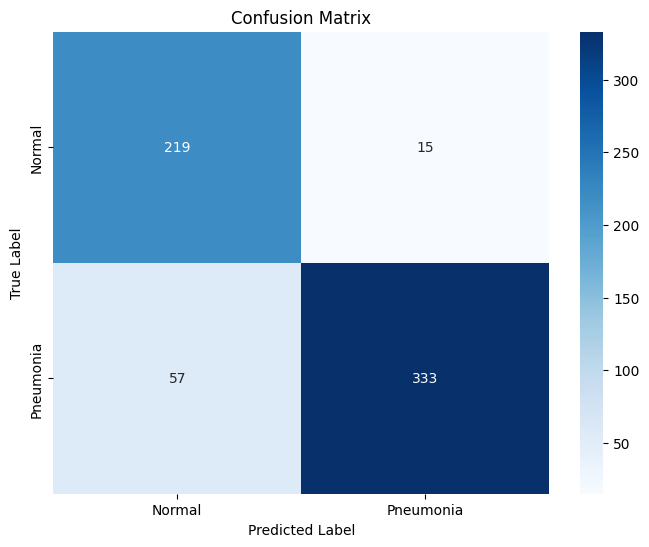


Classification Report:
              precision    recall  f1-score   support

      Normal       0.79      0.94      0.86       234
   Pneumonia       0.96      0.85      0.90       390

    accuracy                           0.88       624
   macro avg       0.88      0.89      0.88       624
weighted avg       0.90      0.88      0.89       624



In [12]:
# Get predictions
test_generator.reset()
y_pred_probs = model.predict(test_generator, verbose=1)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()
y_true = test_generator.classes

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Normal', 'Pneumonia'],
            yticklabels=['Normal', 'Pneumonia'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Classification Report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=['Normal', 'Pneumonia']))


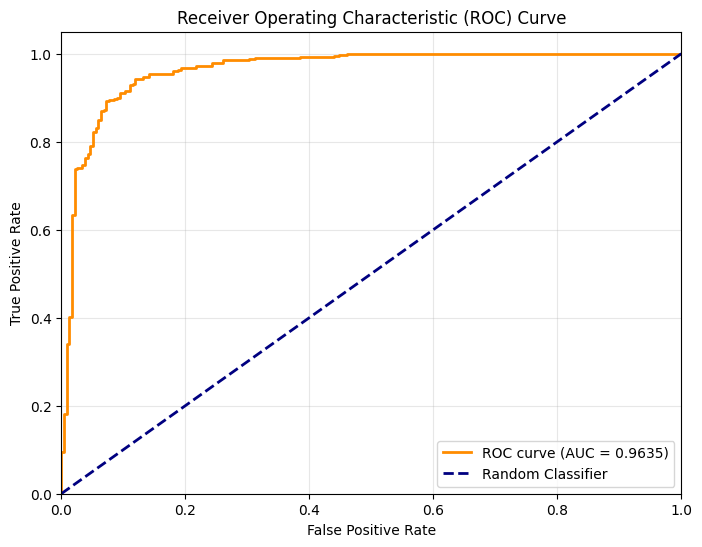

In [13]:
# Plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_true, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


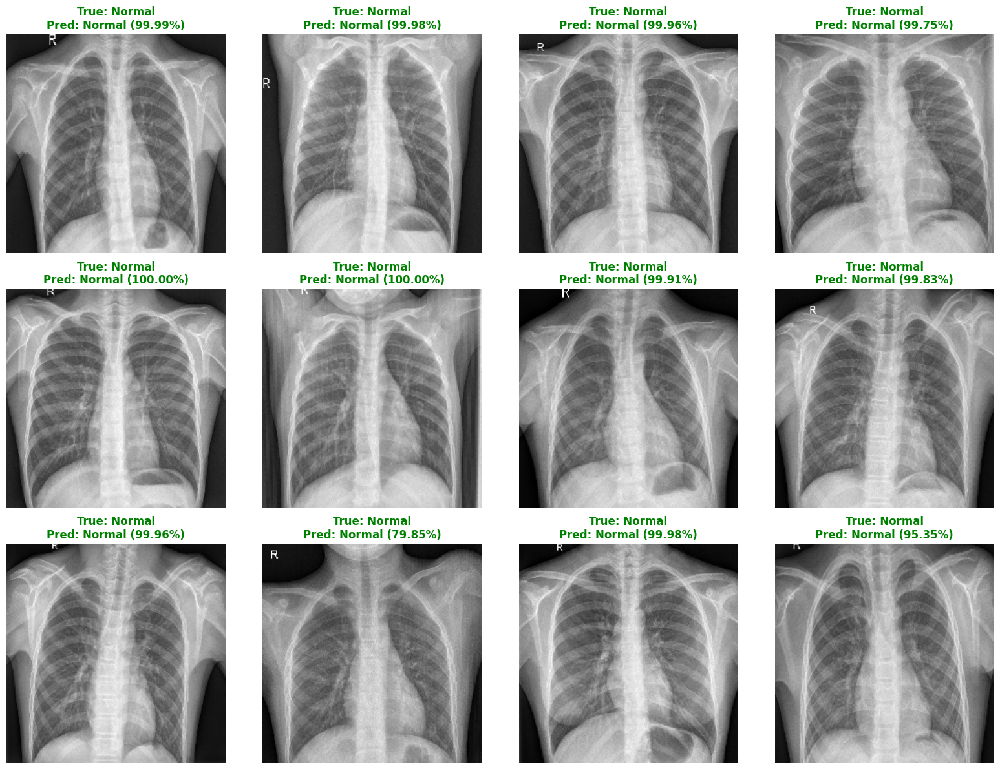

In [14]:
# Visualize predictions on test images
def visualize_predictions(generator, model, num_images=12):
    generator.reset()
    x_batch, y_batch = next(generator)
    predictions = model.predict(x_batch)
    
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    axes = axes.ravel()
    
    for i in range(min(num_images, len(x_batch))):
        axes[i].imshow(x_batch[i])
        
        true_label = 'Pneumonia' if y_batch[i] == 2 else 'Normal'
        pred_label = 'Pneumonia' if predictions[i] > 0.5 else 'Normal'
        confidence = predictions[i][0] if predictions[i] > 0.5 else 1 - predictions[i][0]
        
        color = 'green' if true_label == pred_label else 'red'
        axes[i].set_title(f'True: {true_label}\nPred: {pred_label} ({confidence:.2%})', 
                         color=color, fontweight='bold')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_predictions(test_generator, model)


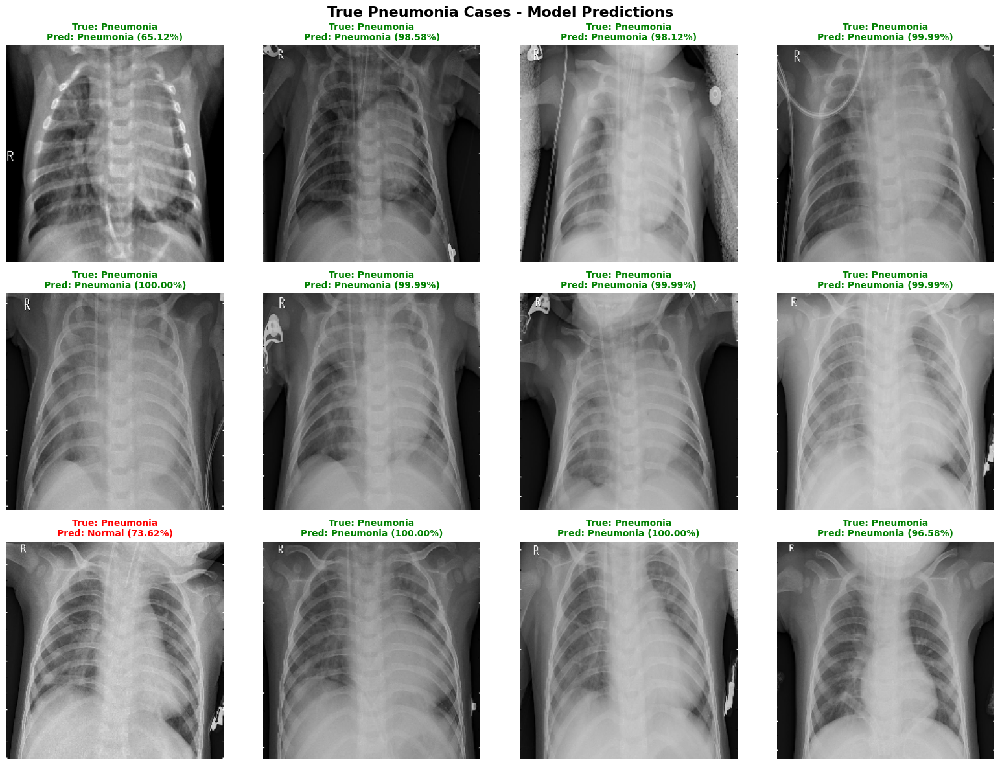

In [15]:
# Visualize predictions on test images - focusing on true Pneumonia cases
def visualize_predictions_pneumonia(generator, model, num_images=12):
    """
    Visualize predictions for true Pneumonia cases from test set
    
    Args:
        generator: Test data generator
        model: Trained model
        num_images: Number of Pneumonia cases to display
    """
    collected_images = 0
    collected_x = []
    collected_true = []
    collected_pred = []
    
    generator.reset()
    
    # Collect true Pneumonia cases
    while collected_images < num_images:
        x_batch, y_batch = next(generator)
        predictions = model.predict(x_batch, verbose=0)
        
        for i in range(len(y_batch)):
            if y_batch[i] == 1:  # True Pneumonia case
                collected_x.append(x_batch[i])
                collected_true.append(y_batch[i])
                collected_pred.append(predictions[i][0])
                collected_images += 1
                
                if collected_images >= num_images:
                    break
    
    # Plot the collected images
    rows = 3
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(16, 12))
    axes = axes.ravel()
    
    for i in range(min(num_images, len(collected_x))):
        axes[i].imshow(collected_x[i])
        
        true_label = 'Pneumonia' if collected_true[i] == 1 else 'Normal'
        pred_label = 'Pneumonia' if collected_pred[i] > 0.5 else 'Normal'
        confidence = collected_pred[i] if collected_pred[i] > 0.5 else 1 - collected_pred[i]
        
        color = 'green' if true_label == pred_label else 'red'
        axes[i].set_title(
            f'True: {true_label}\nPred: {pred_label} ({confidence:.2%})',
            color=color, fontweight='bold', fontsize=10
        )
        axes[i].axis('off')
    
    # Hide unused subplots
    for i in range(len(collected_x), rows * cols):
        axes[i].axis('off')
    
    plt.suptitle('True Pneumonia Cases - Model Predictions', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Call the function to visualize true Pneumonia cases
visualize_predictions_pneumonia(test_generator, model, num_images=12)


Batch 1: No Pneumonia cases found
Batch 2: No Pneumonia cases found
Batch 3: No Pneumonia cases found
Batch 4: No Pneumonia cases found
Batch 5: No Pneumonia cases found
Batch 6: No Pneumonia cases found
Batch 7: No Pneumonia cases found


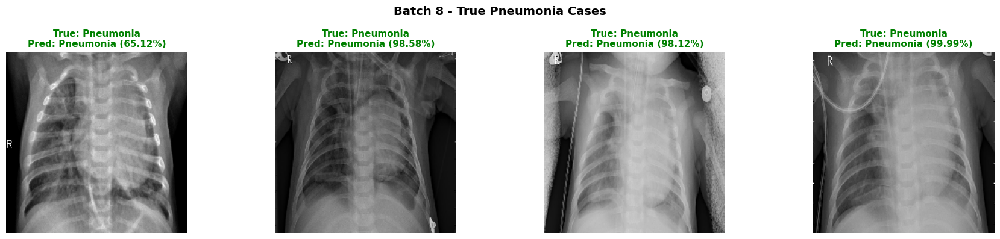

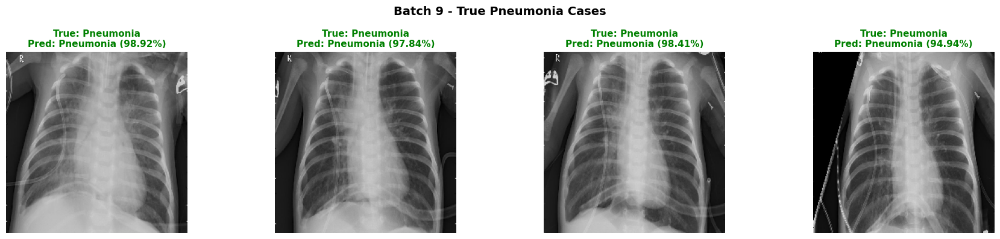

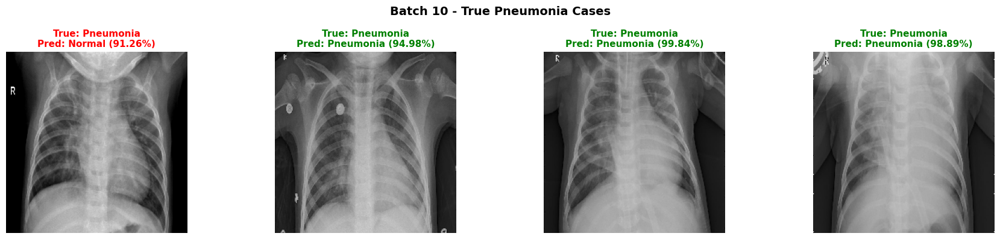

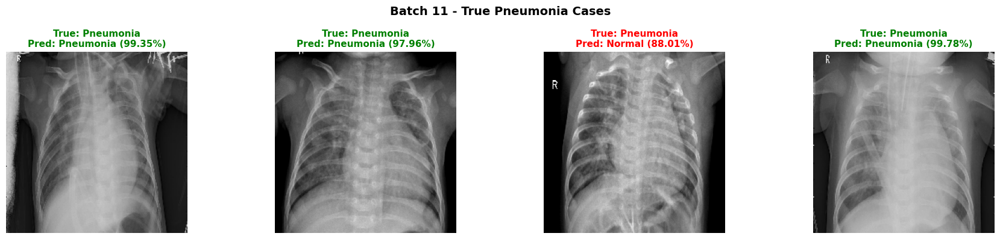

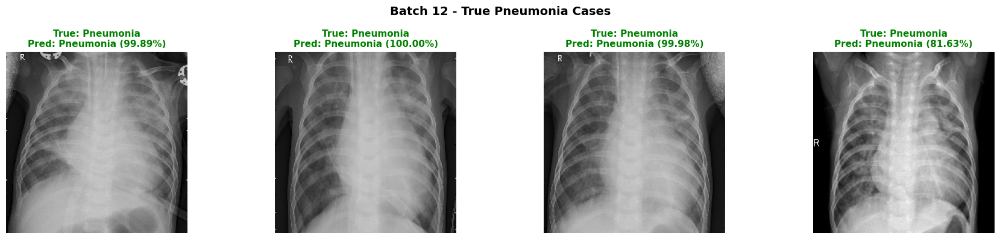

...

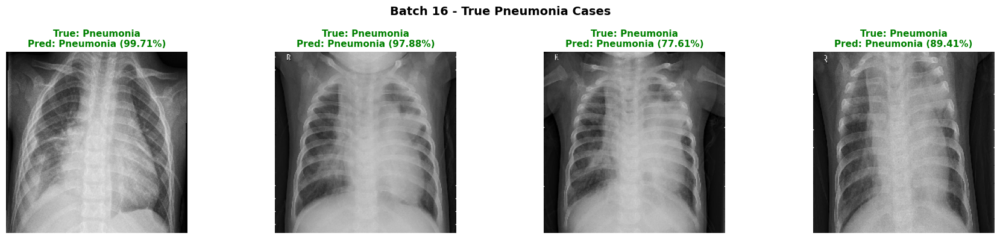

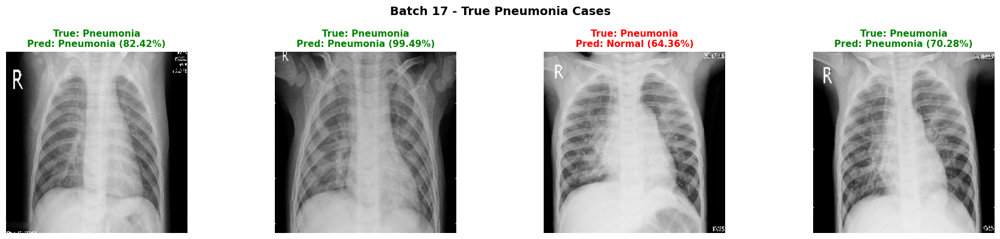

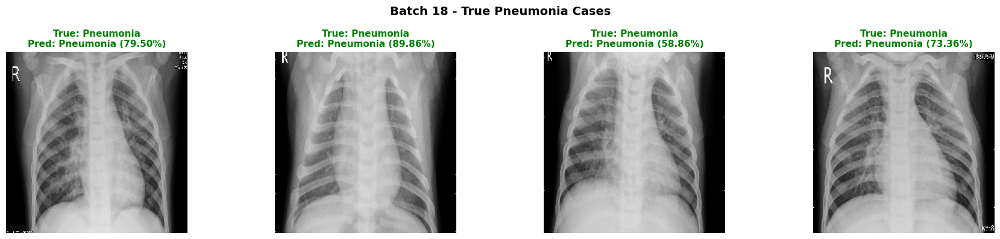

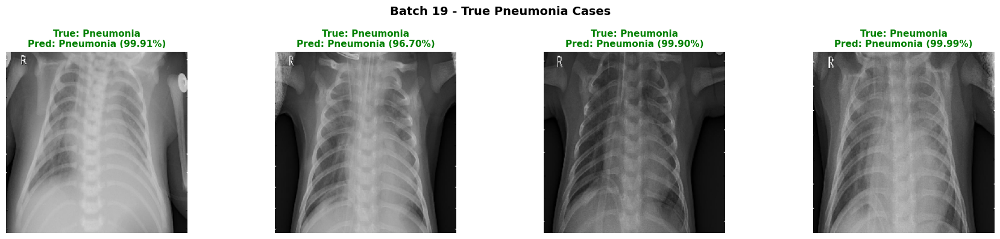

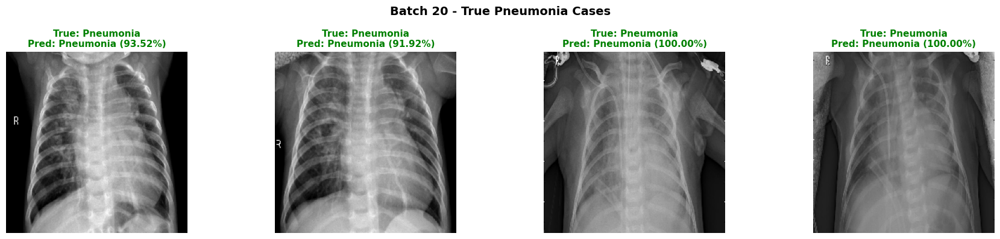

Batch 21: No Pneumonia cases found
Batch 22: No Pneumonia cases found
Batch 23: No Pneumonia cases found
Batch 24: No Pneumonia cases found
Batch 25: No Pneumonia cases found
Batch 26: No Pneumonia cases found
Batch 27: No Pneumonia cases found


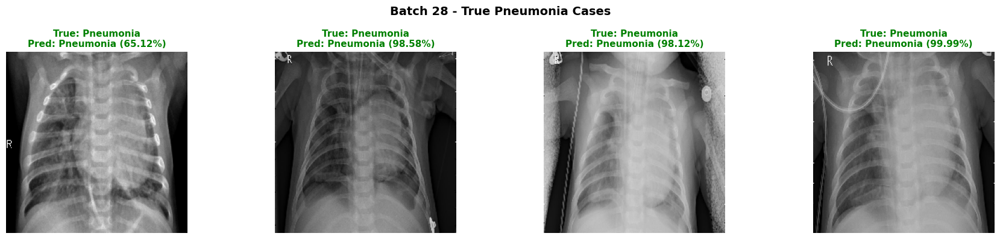

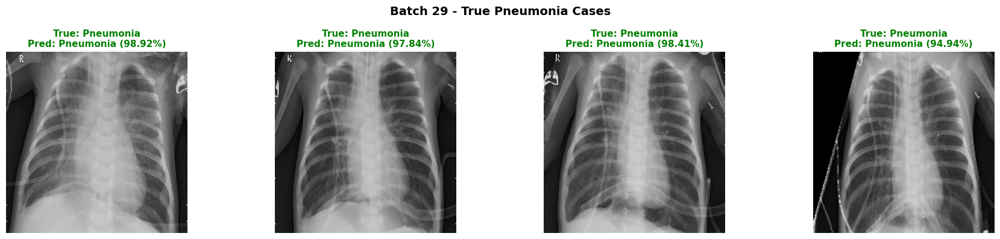

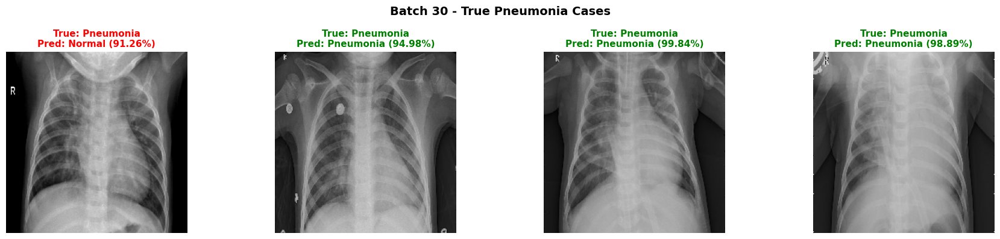

In [16]:
# Visualize predictions from multiple batches
def visualize_multiple_batches(generator, model, num_batches=3):
    """
    Visualize predictions across multiple batches
    
    Args:
        generator: Test data generator
        model: Trained model
        num_batches: Number of batches to visualize
    """
    generator.reset()
    
    for batch_idx in range(num_batches):
        x_batch, y_batch = next(generator)
        predictions = model.predict(x_batch, verbose=0)
        
        # Find pneumonia indices in this batch
        pneumonia_indices = [i for i in range(len(y_batch)) if y_batch[i] == 1]
        
        if len(pneumonia_indices) > 0:
            num_to_show = min(4, len(pneumonia_indices))
            fig, axes = plt.subplots(1, num_to_show, figsize=(18, 4))
            
            # Handle single image case
            if num_to_show == 1:
                axes = [axes]
            
            for idx, i in enumerate(pneumonia_indices[:num_to_show]):
                axes[idx].imshow(x_batch[i])
                
                true_label = 'Pneumonia'
                pred_label = 'Pneumonia' if predictions[i] > 0.5 else 'Normal'
                confidence = predictions[i][0] if predictions[i] > 0.5 else 1 - predictions[i][0]
                
                color = 'green' if true_label == pred_label else 'red'
                axes[idx].set_title(
                    f'True: {true_label}\nPred: {pred_label} ({confidence:.2%})',
                    color=color, fontweight='bold', fontsize=11
                )
                axes[idx].axis('off')
            
            plt.suptitle(f'Batch {batch_idx + 1} - True Pneumonia Cases', 
                        fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()
        else:
            print(f"Batch {batch_idx + 1}: No Pneumonia cases found")

# Call the function to check 5 batches
visualize_multiple_batches(test_generator, model, num_batches=30)
